In [1]:
from google.colab import drive
import sys

drive.mount('/content/gdrive/')
path = '/content/gdrive/MyDrive/Entrega ZANE/'
sys.path.append(path)
# path='./'

# Visualizações com o formato de heatmap

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

sns.set_style("whitegrid")

df = pd.read_csv(path+'dados limpos/abastecimentos.csv')
dados_veiculos = pd.read_csv(path+'dados/informacoes_veiculos.csv')
dados_veiculos = dados_veiculos.rename(columns={'fleet_number': 'vehicle_number'})
df = pd.merge(left=df, right=dados_veiculos, on='vehicle_number', how='left')
df

,Unnamed: 0_x,vehicle_number,vehicle_name,timestamp,consumption,liter_supply,km_driven,odometer,establishment_code,fuel_type,...,vehicle_weight,plate,vehicle_pto_use,vehicle_gas_reduction,tank_capacity,vehicle_brand,vehicle_classification_euro,vehicle_year,fleet_type,vehicle_card
0,1908,65,WM_LTS8E38,1606947738000,3.05,108.08,330.0,22206.0,11830897.0,Diesel S-10 Comum,...,0.0,LTS8E38,sim,egr,0,volkswagen,euro05,2018,White Martins,NaN
1,1907,65,WM_LTS8E38,1607125218000,2.77,150.02,415.0,22621.0,11830897.0,Diesel S-10 Comum,...,0.0,LTS8E38,sim,egr,0,volkswagen,euro05,2018,White Martins,NaN
2,1906,65,WM_LTS8E38,1607357534000,2.80,115.35,323.0,22944.0,11830897.0,Diesel S-10 Comum,...,0.0,LTS8E38,sim,egr,0,volkswagen,euro05,2018,White Martins,NaN
3,1905,65,WM_LTS8E38,1607463161000,2.76,80.55,222.0,23166.0,11830897.0,Diesel S-10 Comum,...,0.0,LTS8E38,sim,egr,0,volkswagen,euro05,2018,White Martins,NaN
4,1904,65,WM_LTS8E38,1607555632000,3.09,81.30,251.0,23417.0,11830897.0,Diesel S-10 Comum,...,0.0,LTS8E38,sim,egr,0,volkswagen,euro05,2018,White Martins,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9674,5417,2860,WM_QUJ3665,1681133939000,1.91,424.88,810.0,157508.0,11830897.0,DIESEL S-10 COMUM,...,0.0,QUJ3665,sim,scr,0,mercedes,euro05,2019,Locação - Vamos,NaN
9675,5416,2860,WM_QUJ3665,1681260720000,2.02,170.03,343.0,157851.0,11830897.0,DIESEL S-10 COMUM,...,0.0,QUJ3665,sim,scr,0,mercedes,euro05,2019,Locação - Vamos,NaN
9676,5415,2860,WM_QUJ3665,1681435864000,2.06,119.10,245.0,158096.0,11830897.0,DIESEL S-10 COMUM,...,0.0,QUJ3665,sim,scr,0,mercedes,euro05,2019,Locação - Vamos,NaN
9677,5414,2860,WM_QUJ3665,1681656330000,2.10,162.90,342.0,158438.0,11830897.0,DIESEL S-10 COMUM,...,0.0,QUJ3665,sim,scr,0,mercedes,euro05,2019,Locação - Vamos,NaN


In [3]:

df['driver_registration'] = df['driver_registration'].astype(str)
df['vehicle_number'] = df['vehicle_number'].astype(str)

# Ordenação
df = df.sort_values(by='driver_registration', kind='mergesort')
df = df.sort_values(by='vehicle_pto_use', kind='mergesort')
df = df.sort_values(by='vehicle_type', kind='mergesort')

df.head(10)

,Unnamed: 0_x,vehicle_number,vehicle_name,timestamp,consumption,liter_supply,km_driven,odometer,establishment_code,fuel_type,...,vehicle_weight,plate,vehicle_pto_use,vehicle_gas_reduction,tank_capacity,vehicle_brand,vehicle_classification_euro,vehicle_year,fleet_type,vehicle_card
7065,3823,1343,WM_QUJ3671,1622820710000,1.29,144.90,187.0,39936.0,11830897.0,Diesel S-10 Comum,...,NaN,QUJ3671,sim,scr,0,mercedes,euro05,2019,Locação - Vamos,NaN
6245,3355,1293,WM_QUJ3717,1610569729000,2.39,422.82,1009.0,37934.0,11830897.0,Diesel S-10 Comum,...,NaN,QUJ3717,sim,scr,0,mercedes,euro05,2019,Locação - Vamos,NaN
6459,8311,1321,WM_QUJ3668,1611498844000,1.63,47.83,78.0,14860.0,11830897.0,Diesel S-10 Comum,...,NaN,QUJ3668,sim,scr,0,mercedes,euro05,2019,Locação - Vamos,NaN
6470,8300,1321,WM_QUJ3668,1612014498000,1.54,51.19,79.0,15769.0,11830897.0,Diesel S-10 Comum,...,NaN,QUJ3668,sim,scr,0,mercedes,euro05,2019,Locação - Vamos,NaN
6241,3348,1293,WM_QUJ3717,1608735798000,1.89,459.19,868.0,34692.0,11830897.0,Diesel S-10 Comum,...,NaN,QUJ3717,sim,scr,0,mercedes,euro05,2019,Locação - Vamos,NaN
6522,8411,1321,WM_QUJ3668,1618057522000,1.98,39.90,79.0,24520.0,11830897.0,Diesel S-10 Comum,...,NaN,QUJ3668,sim,scr,0,mercedes,euro05,2019,Locação - Vamos,NaN
6527,8406,1321,WM_QUJ3668,1618504451000,1.69,46.66,79.0,25292.0,11830897.0,Diesel S-10 Comum,...,NaN,QUJ3668,sim,scr,0,mercedes,euro05,2019,Locação - Vamos,NaN
6529,8404,1321,WM_QUJ3668,1618577848000,1.54,51.28,79.0,25444.0,11830897.0,Diesel S-10 Comum,...,NaN,QUJ3668,sim,scr,0,mercedes,euro05,2019,Locação - Vamos,NaN
6532,8401,1321,WM_QUJ3668,1618671660000,1.79,44.15,79.0,25684.0,11830897.0,Diesel S-10 Comum,...,NaN,QUJ3668,sim,scr,0,mercedes,euro05,2019,Locação - Vamos,NaN
6803,3557,1326,WM_QUJ3708,1613914272000,1.90,60.03,114.0,52736.0,11830897.0,Diesel S-10 Comum,...,NaN,QUJ3708,sim,scr,0,mercedes,euro04,2019,Locação - Vamos,NaN


### Primeiro Scatter

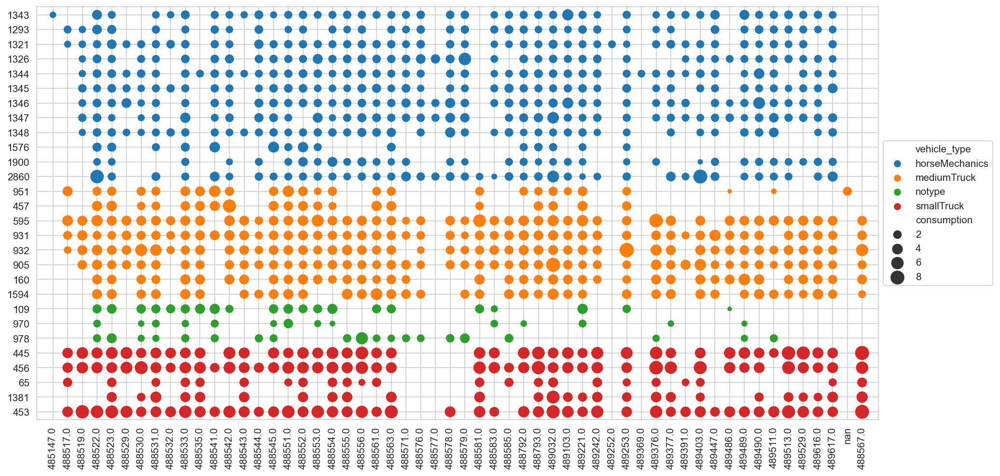

In [4]:

def styled_scatter(df, x = "driver_registration", y = "vehicle_number", size = "consumption", hue = "vehicle_type"):

    fig, ax = plt.subplots(figsize=(15,15),dpi=150)
    g = sns.scatterplot(
        data=df,
        x=x,
        y=y,
        size=size,
        hue=hue,
        sizes=(20, 200),
        linewidth=0
    )

    ax.set(xlabel="", ylabel="", aspect="equal")
    ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    ax.margins(.02)
    for label in g.get_xticklabels():
        label.set_rotation(90)
        
    plt.show()

styled_scatter(df)

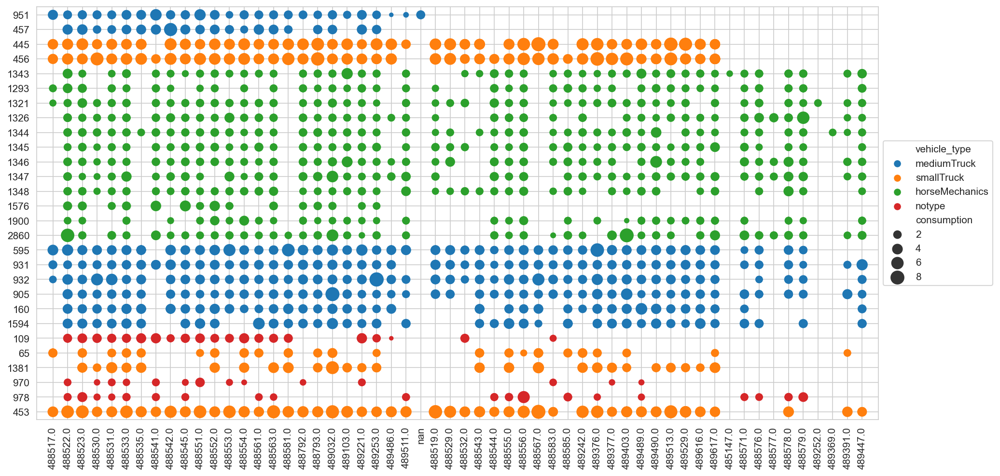

In [5]:

df = df.sort_values(by='vehicle_pto_use', kind='mergesort')
styled_scatter(df, hue="vehicle_type")

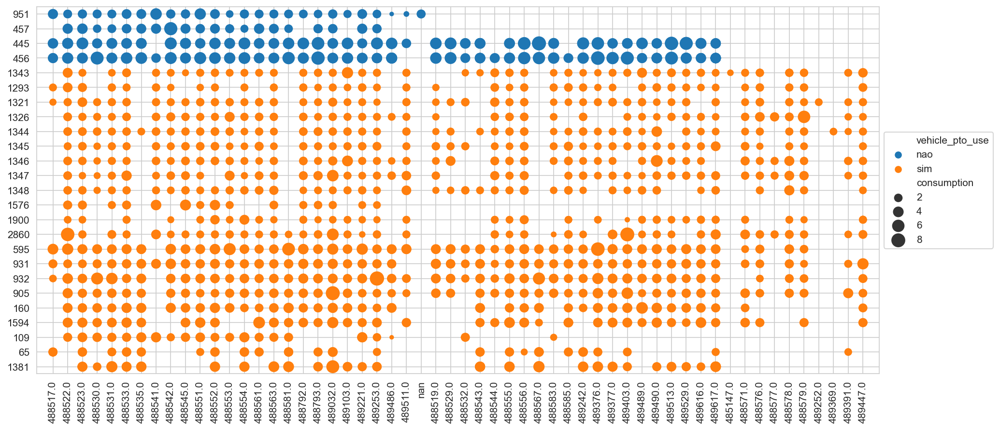

In [6]:

df = df.sort_values(by='vehicle_pto_use', kind='mergesort')
styled_scatter(df, hue="vehicle_pto_use")

In [7]:
# Ordenação
df = df.sort_values(by='driver_registration', kind='mergesort')
df = df.sort_values(by='vehicle_pto_use', kind='mergesort')
df = df.sort_values(by='vehicle_type', kind='mergesort')

means = pd.pivot_table(
    df, 
    values='consumption', 
    index=['vehicle_type', 'vehicle_number'],
    columns=['driver_registration'],
    aggfunc=np.mean
)

means.head()

driver_registration            485147.0  488517.0  488519.0  488522.0  \
vehicle_type   vehicle_number                                           
horseMechanics 1293                 NaN     2.390     1.890  2.255000   
               1321                 NaN     1.585     1.750  1.878000   
               1326                 NaN       NaN     1.900  2.330000   
               1343                1.29       NaN       NaN  2.413333   
               1344                 NaN       NaN     1.625  2.127500   

driver_registration            488523.0  488529.0  488530.0  488531.0  \
vehicle_type   vehicle_number                                           
horseMechanics 1293            2.643333       NaN       NaN  2.350000   
               1321            2.086000      1.95  1.774286  2.031000   
               1326            2.203333       NaN  2.090000  2.140000   
               1343            1.982500       NaN       NaN  1.945000   
               1344            2.363333      2.42  2.314000  1.891667   

driver_registration            488532.0  488533.0  ...  489447.0  489486.0  \
vehicle_type   vehicle_number                      ...                       
horseMechanics 1293                 NaN  1.873333  ...  2.080769       NaN   
               1321             1.90875  1.811875  ...  2.250000       NaN   
               1326                 NaN  2.285833  ...  1.996667     2.105   
               1343             1.64000  2.230714  ...  2.623750       NaN   
               1344                 NaN  2.043000  ...  2.283333       NaN   

driver_registration            489489.0  489490.0  489511.0  489513.0  \
vehicle_type   vehicle_number                                           
horseMechanics 1293            2.130000  2.455000  1.842500    2.2225   
               1321            2.070000  1.905000  2.323333    1.9125   
               1326            1.905455  1.930000  2.066000    2.1175   
               1343            2.385000  2.074286  2.171667    2.6800   
               1344            1.970000  3.044000  2.236000       NaN   

driver_registration            489529.0  489616.0  489617.0  nan  
vehicle_type   vehicle_number                                     
horseMechanics 1293            2.053333  1.856667  1.845000  NaN  
               1321            2.295000       NaN  2.670000  NaN  
               1326            2.100000  1.934000  1.905000  NaN  
               1343            2.375000  2.147000  2.013333  NaN  
               1344            2.127500  1.803333  2.180000  NaN  

[5 rows x 56 columns]

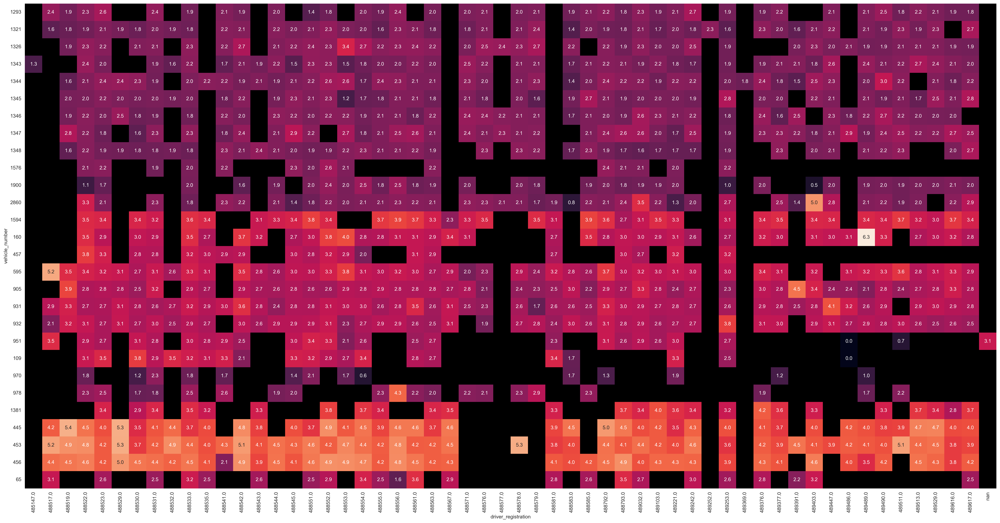

In [8]:
vertical, horizontal = means.shape
fig, ax = plt.subplots(figsize=(horizontal*0.5, vertical*0.5),dpi=300)
fig.tight_layout()

means = means.droplevel(level=0)
g = sns.heatmap(data=means, annot=True, cbar=False,fmt=".1f", square=True)
g.set_facecolor('Black')

ax.tick_params(axis='x', labelrotation=90)
ax.tick_params(axis='y', labelrotation=0)

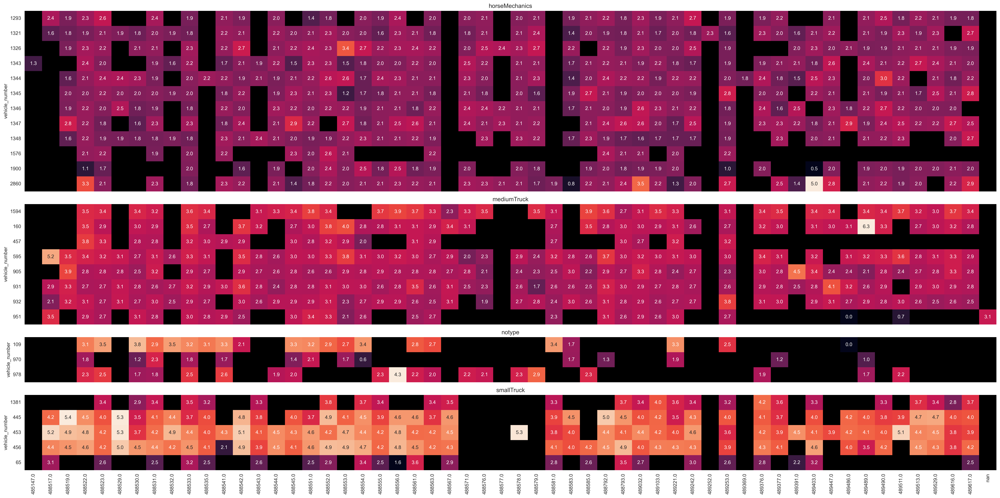

In [9]:
def styled_grouped_heatmap(group):
    means = pd.pivot_table(
        df, 
        values='consumption', 
        index=[group, 'vehicle_number'],
        columns=['driver_registration'],
        aggfunc=np.mean
    )

    groups = means.groupby(group)
    n_groups = len(groups)
    hr, wr = [], []
    for tipo, data in groups:
        h, w = data.shape
        hr.append(h)
        wr.append(w)
    n_groups = len(groups)

    gridspec_kw={'height_ratios': hr}
    vertical, horizontal = means.shape
    f, axs = plt.subplots(
        figsize=(horizontal*0.5, vertical*0.5), 
        nrows=n_groups, 
        sharex=True, 
        gridspec_kw=gridspec_kw,
        dpi=300
    )

    for i, (key, data) in enumerate(means.groupby(group)):
        data = data.droplevel(level=0)
        g = sns.heatmap(
            data=data,
            cbar=False,
            fmt=".1f", 
            ax=axs[i],
            annot=True
        )
        g.set_facecolor('Black')
        g.set_title(key)
        g.set_xlabel('')
        axs[i].tick_params(axis='y', labelrotation=0)
    f.tight_layout()
    
styled_grouped_heatmap('vehicle_type')

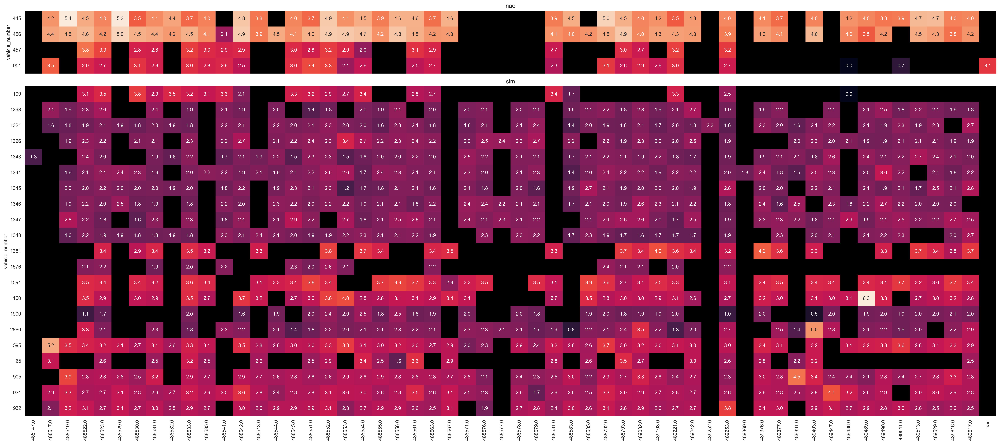

In [10]:
styled_grouped_heatmap('vehicle_pto_use')

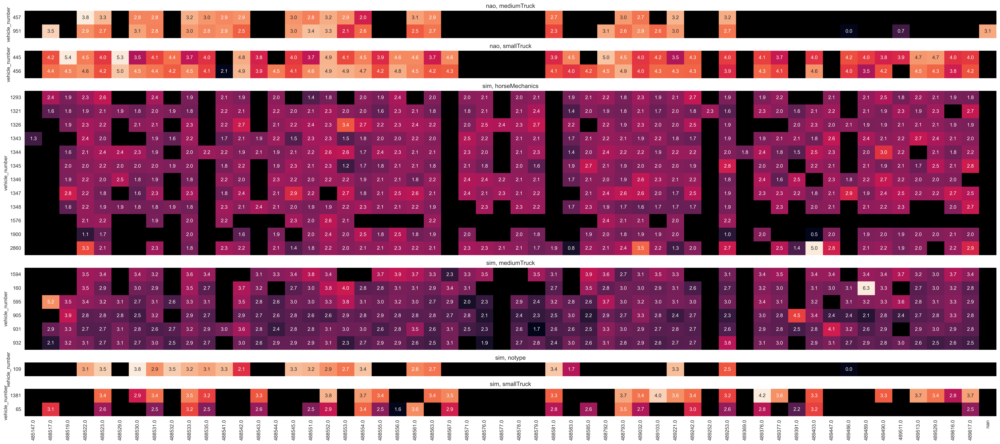

In [11]:
df["pto_type"] = df["vehicle_pto_use"] + ", " + df["vehicle_type"]
styled_grouped_heatmap('pto_type')

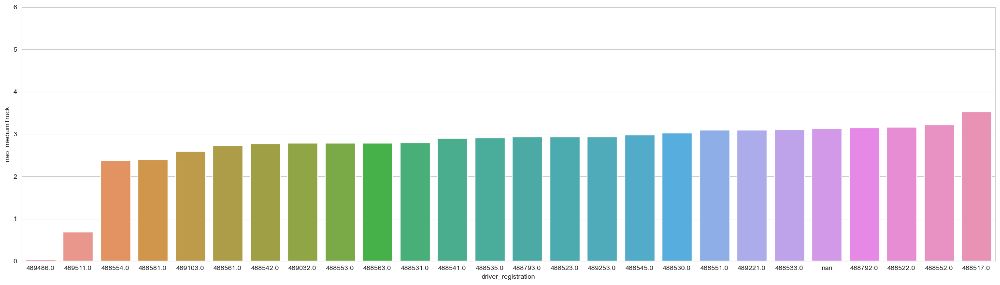

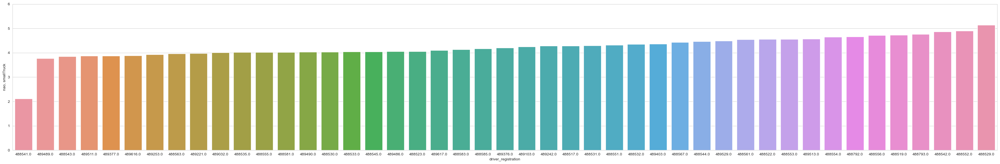

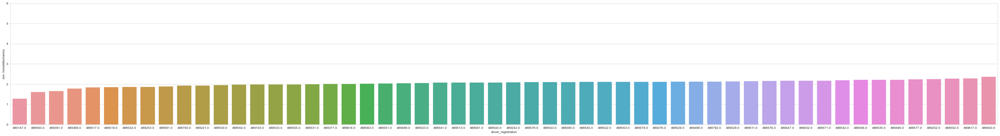

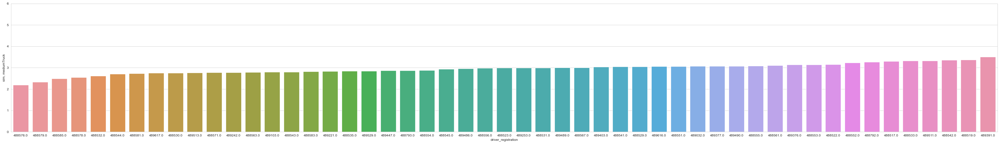

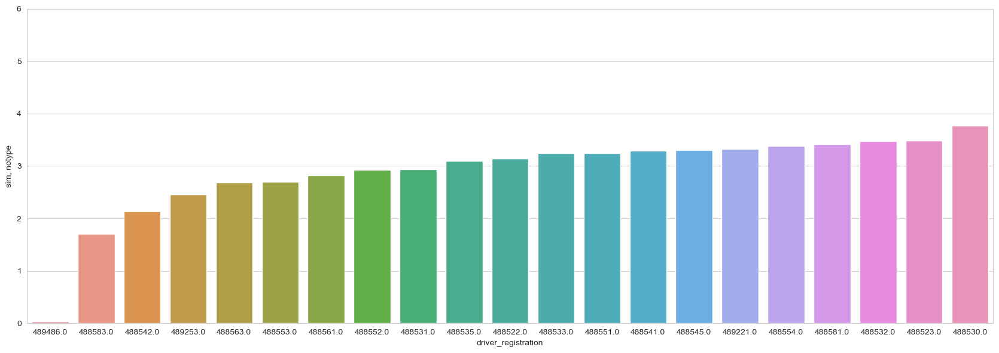

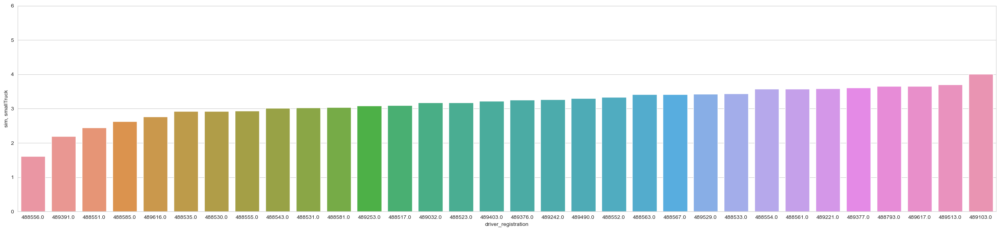

In [12]:
means = pd.pivot_table(
    df, 
    values='consumption', 
    index=['driver_registration'],
    columns=['pto_type'],
    aggfunc=np.mean
)
for column in means:
    sorted_means = means.sort_values(column)
    sorted_means = sorted_means[sorted_means[column].notna()]
    horizontal = len(sorted_means)
    f, ax = plt.subplots(figsize=(horizontal*0.8, 6))
    plt.ylim([0, 6])
    sns.barplot(data = sorted_means, x=sorted_means.index, y=column)
    f.tight_layout()

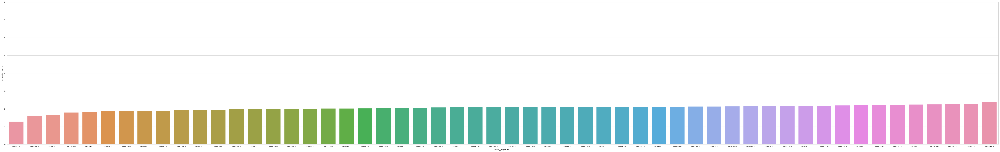

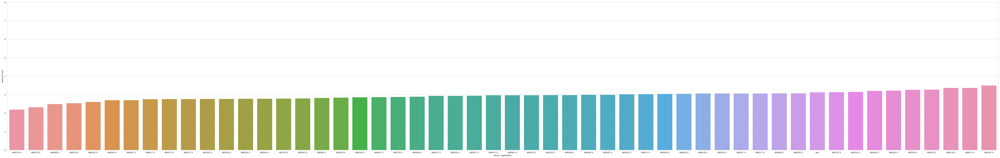

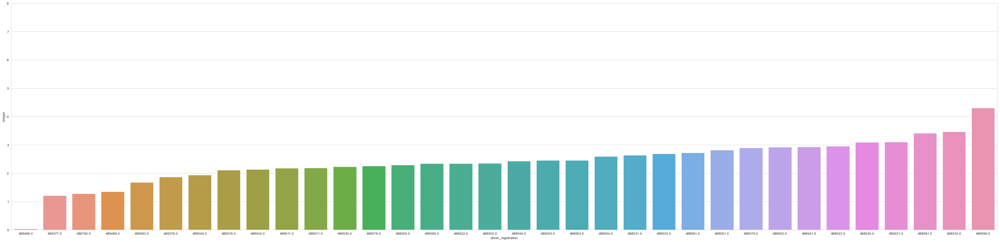

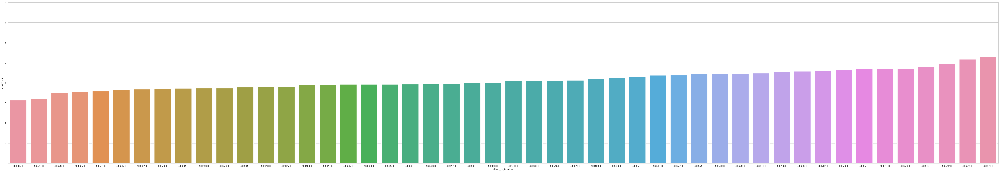

In [13]:
means = pd.pivot_table(
    df, 
    values='consumption', 
    index=['driver_registration'],
    columns=['vehicle_type'],
    aggfunc=np.mean
)
for column in means:
    sorted_means = means.sort_values(column)
    sorted_means = sorted_means[sorted_means[column].notna()]
    horizontal = len(sorted_means)
    f, ax = plt.subplots(figsize=(horizontal*1.2, 10))
    plt.ylim([0, 8])
    sns.barplot(data = sorted_means, x=sorted_means.index, y=column)
    f.tight_layout()

C:\Users\anton\AppData\Local\Temp\ipykernel_39116\3428558864.py:12: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  f, ax = plt.subplots(figsize=(horizontal*1.2, 10))


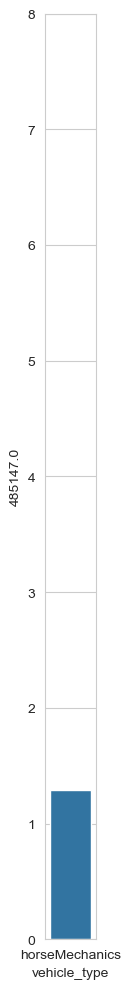

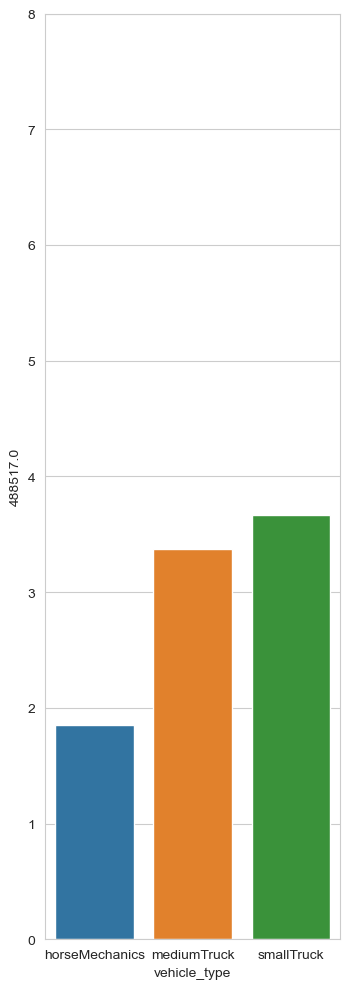

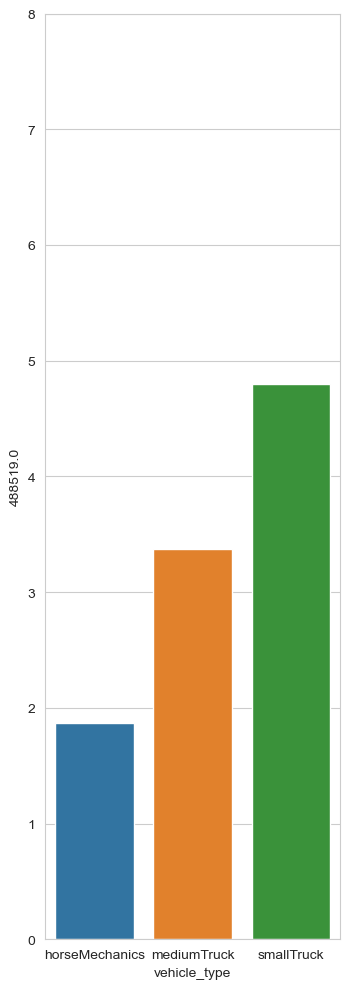

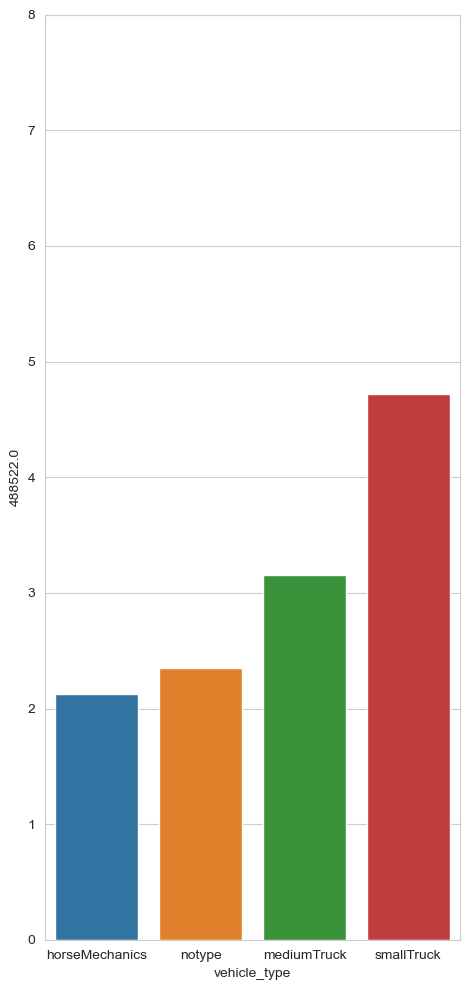

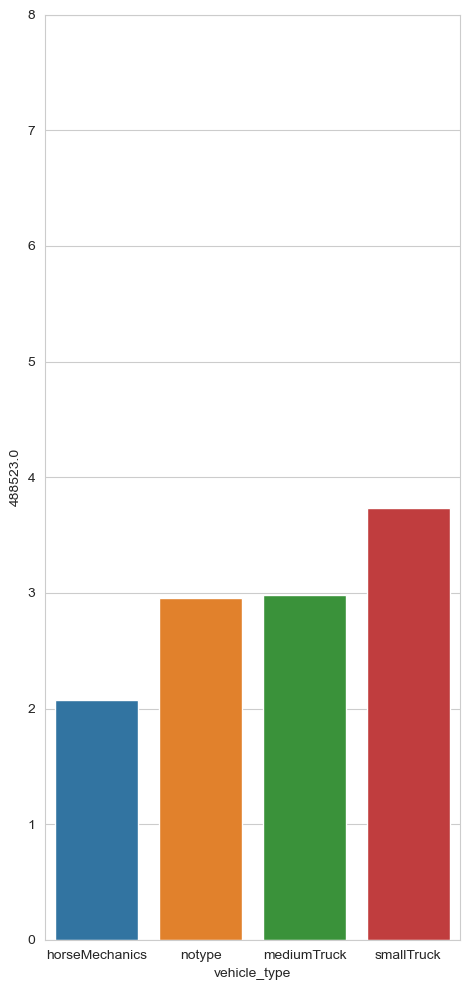

...

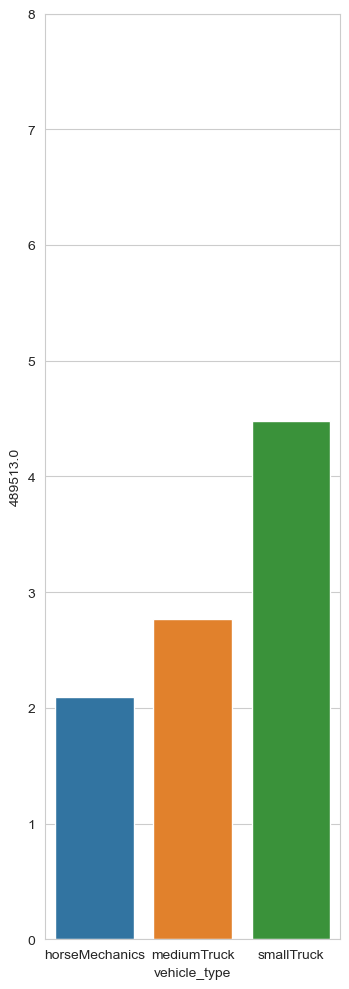

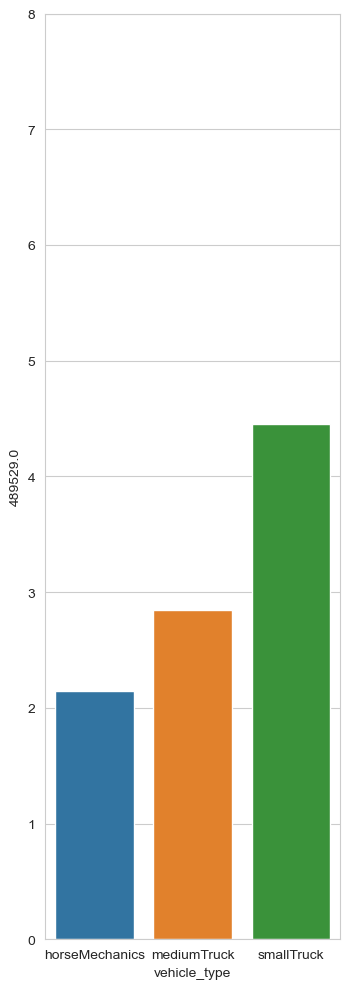

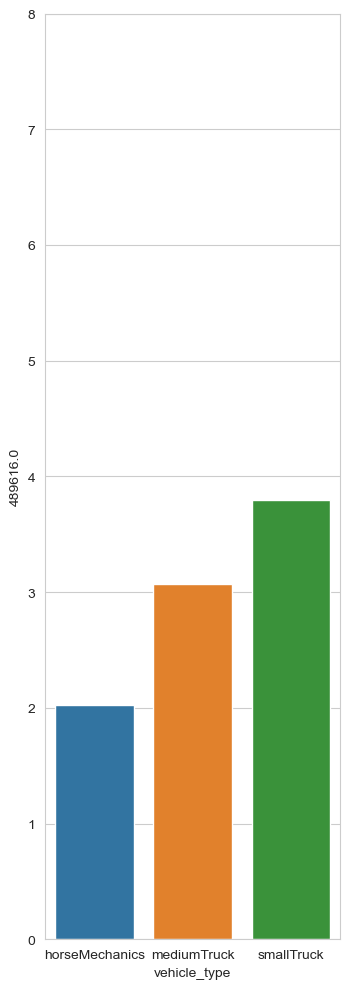

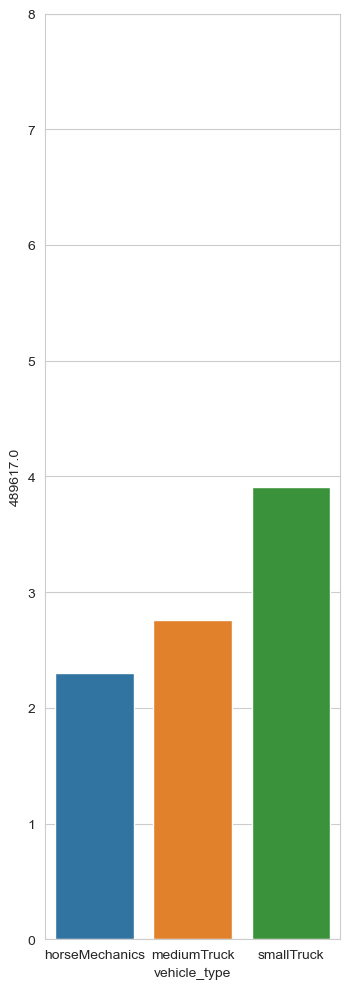

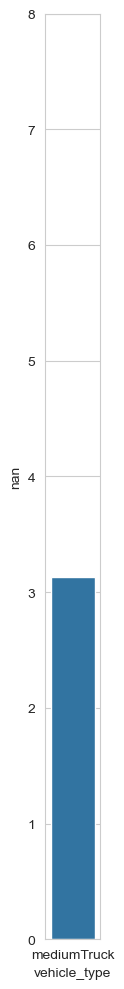

In [14]:
means = pd.pivot_table(
    df, 
    values='consumption', 
    index=['vehicle_type'],
    columns=['driver_registration'],
    aggfunc=np.mean
)
for column in means:
    sorted_means = means.sort_values(column)
    sorted_means = sorted_means[sorted_means[column].notna()]
    horizontal = len(sorted_means)
    f, ax = plt.subplots(figsize=(horizontal*1.2, 10))
    plt.ylim([0, 8])
    sns.barplot(data = sorted_means, x=sorted_means.index, y=column)
    f.tight_layout()

C:\Users\anton\AppData\Local\Temp\ipykernel_39116\503348535.py:35: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


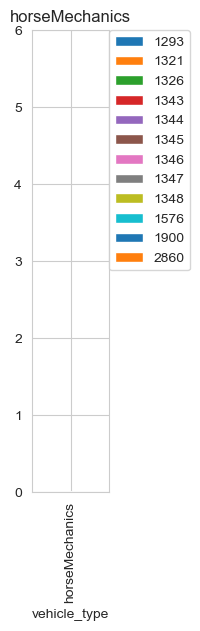

C:\Users\anton\AppData\Local\Temp\ipykernel_39116\503348535.py:35: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


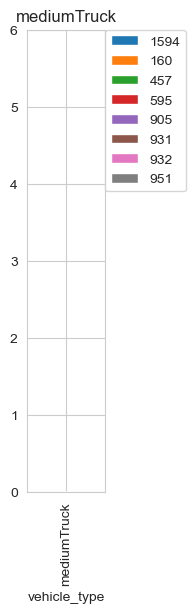

C:\Users\anton\AppData\Local\Temp\ipykernel_39116\503348535.py:35: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


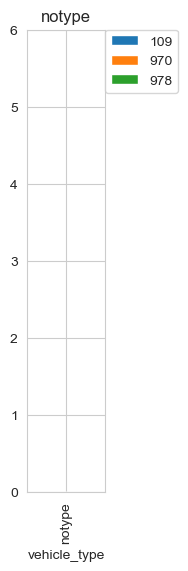

C:\Users\anton\AppData\Local\Temp\ipykernel_39116\503348535.py:35: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


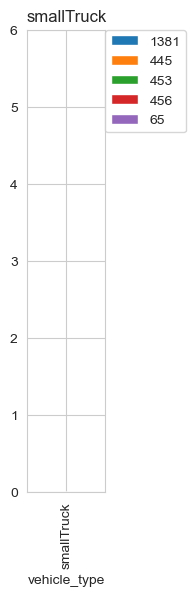

In [15]:


for i, data in df.groupby('vehicle_type'):
    sum = pd.pivot_table(
        data, 
        values='consumption', 
        index=['vehicle_type'],
        columns=['vehicle_number'],
        aggfunc=np.sum,
        dropna=True
    )
    
    freq = pd.pivot_table(
        data, 
        values='consumption', 
        index=['driver_registration'],
        columns=['vehicle_number'],
        aggfunc='count',
        dropna=True
    )

    horizontal = len(sum)
    for column in sum:
        sum[column] = sum[column]/freq.sum(axis=1)

    sum['mean'] = sum.sum(axis=1)
    sum = sum.sort_values('mean')
    

    sum = sum.drop(columns='mean')
    horizontal = len(sum)
    ax = sum.plot(kind='bar', stacked=True, figsize=(horizontal,6))
    ax.set_title(i)
    ax.set_ylim(0, 6)

    plt.legend(bbox_to_anchor=(1, 1), loc='upper left', borderaxespad=0)
    plt.tight_layout()    
    plt.show()

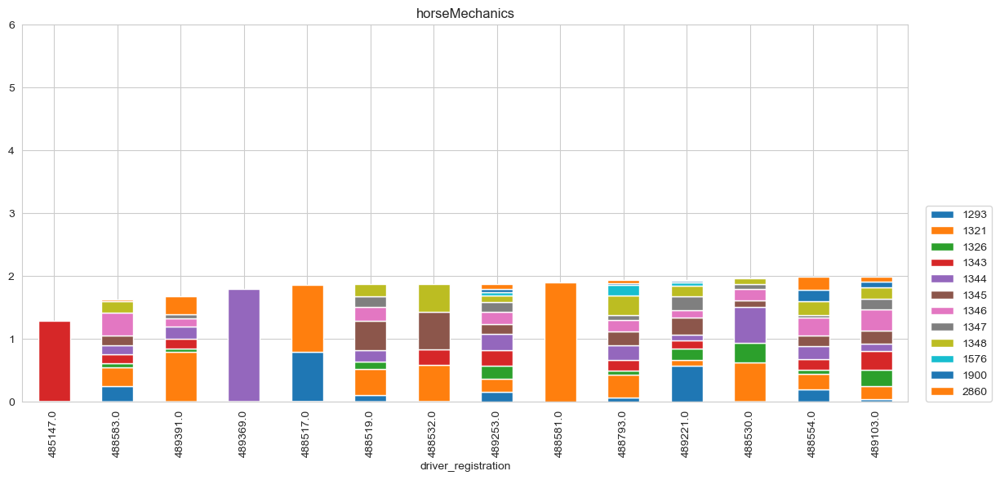

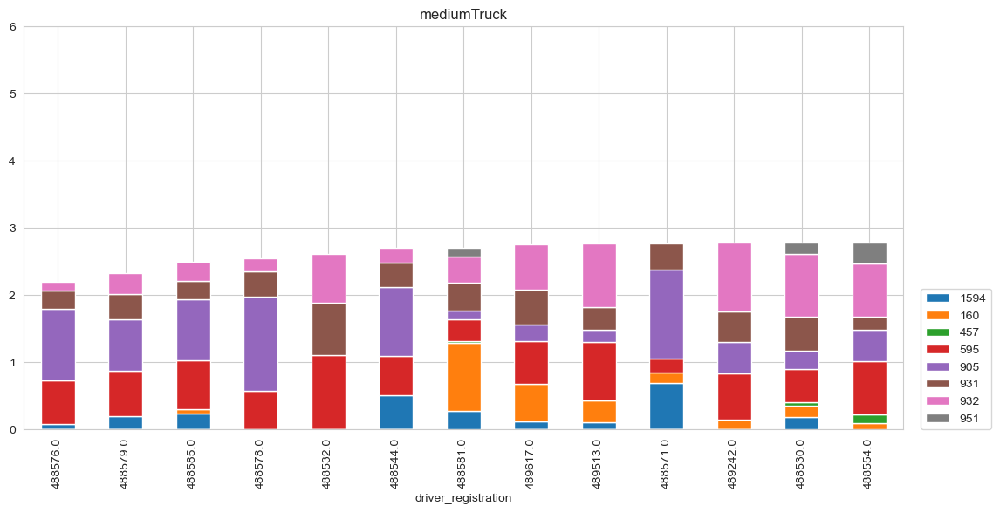

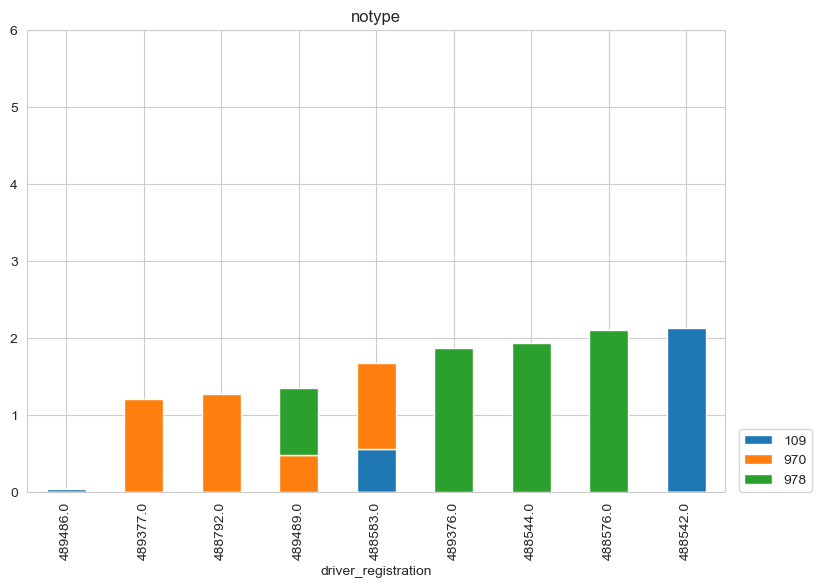

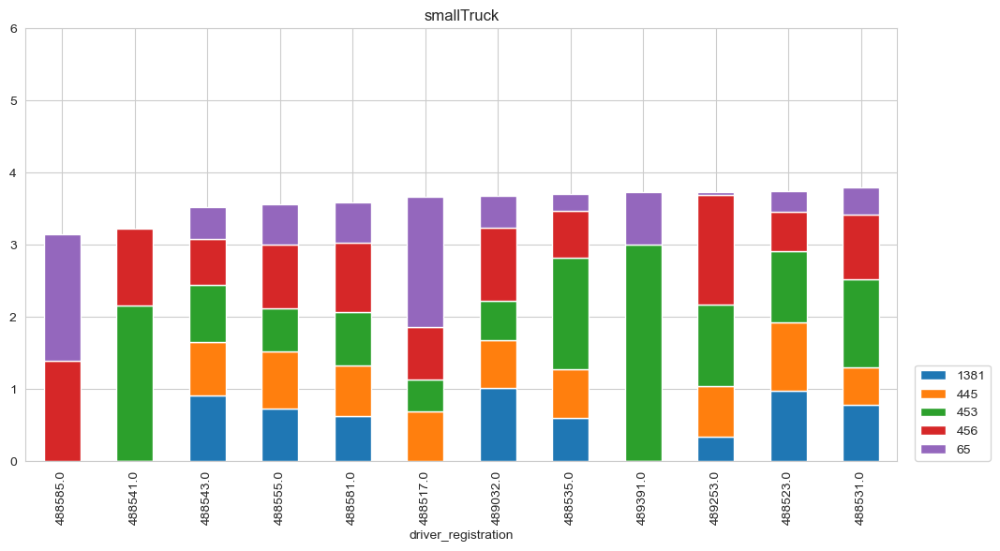

In [16]:
for i, data in df.groupby('vehicle_type'):
    sum = pd.pivot_table(
        data, 
        values='consumption', 
        index=['driver_registration'],
        columns=['vehicle_number'],
        aggfunc=np.sum,
        dropna=True
    )
    
    freq = pd.pivot_table(
        data, 
        values='consumption', 
        index=['driver_registration'],
        columns=['vehicle_number'],
        aggfunc='count',
        dropna=True
    )

    horizontal = len(sum)
    for column in sum:
        sum[column] = sum[column]/freq.sum(axis=1)

    sum['mean'] = sum.sum(axis=1)
    sum = sum.sort_values('mean')
    
    quantile_range = 0.25
    quantile_range = np.ceil(len(sum)*quantile_range)
    sum = sum.head(int(quantile_range))

    sum = sum.drop(columns='mean')
    horizontal = len(sum)
    ax = sum.plot(kind='bar', stacked=True, figsize=(horizontal,6))
    ax.set_title(i)
    ax.set_ylim(0, 6)

    plt.legend(bbox_to_anchor=(1.02, 0), loc='lower left', borderaxespad=0)
    plt.show()

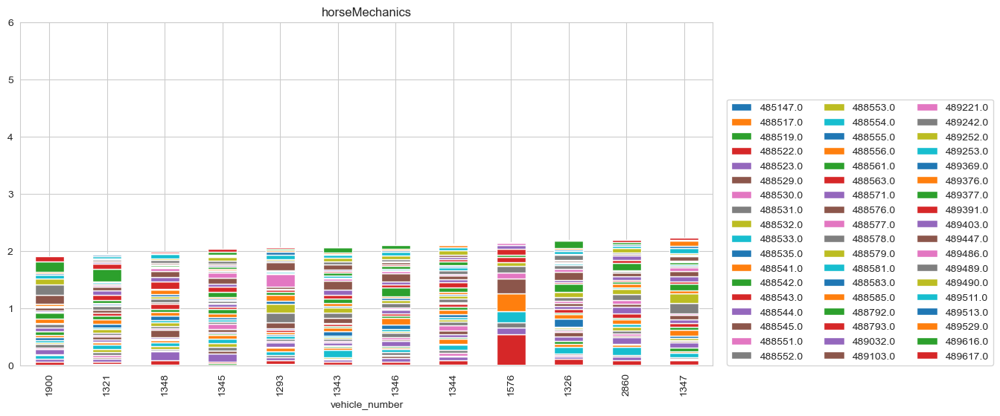

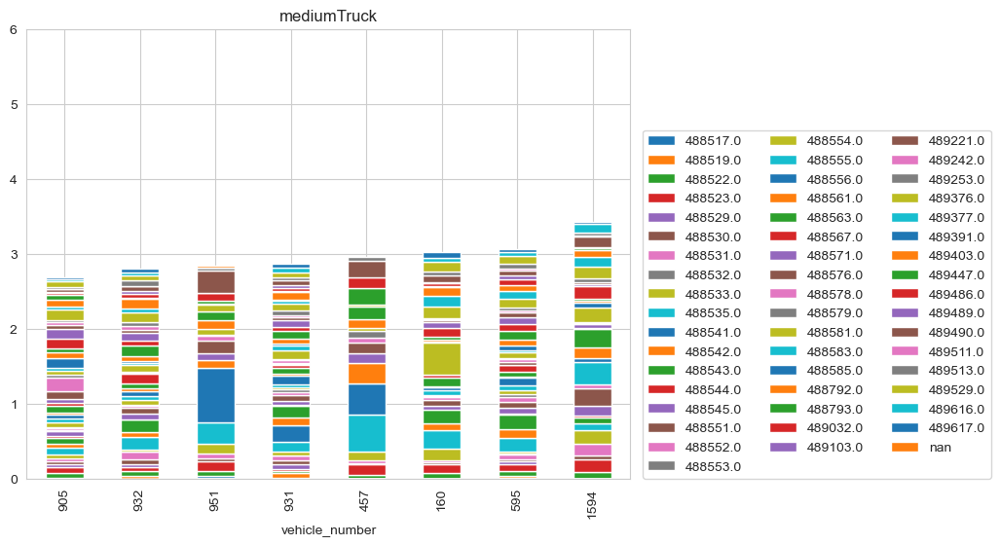

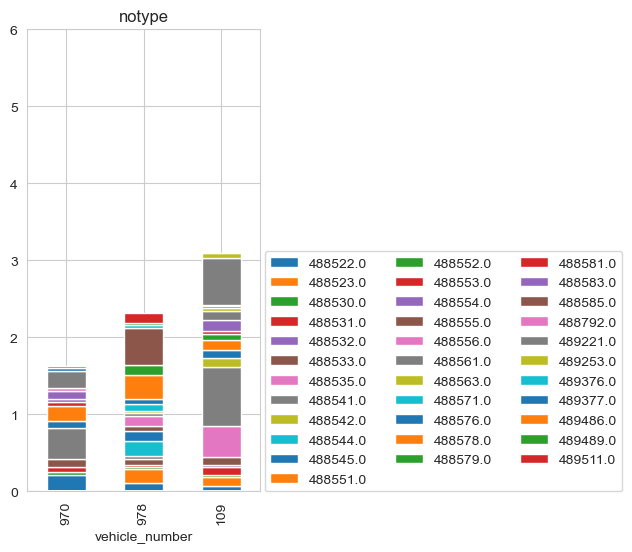

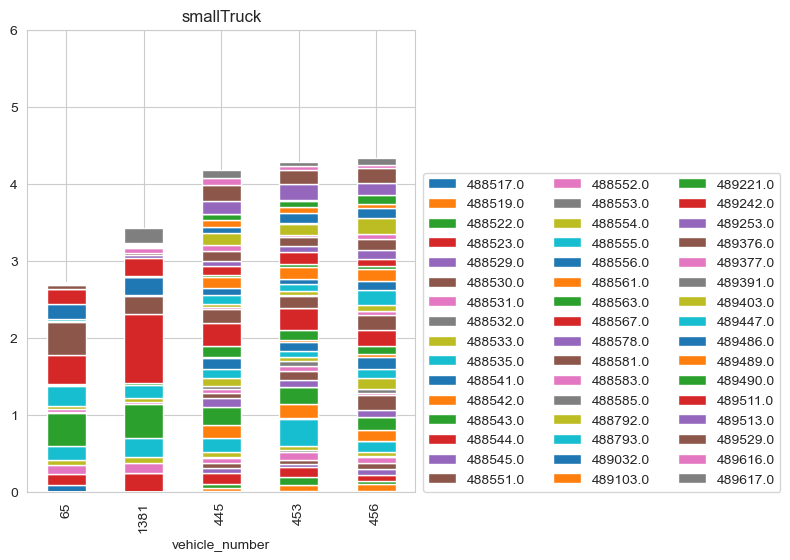

In [17]:


for i, data in df.groupby('vehicle_type'):
    sum = pd.pivot_table(
        data, 
        values='consumption', 
        index=['vehicle_number'],
        columns=['driver_registration'],
        aggfunc=np.sum,
        dropna=True
    )
    
    freq = pd.pivot_table(
        data, 
        values='consumption', 
        index=['vehicle_number'],
        columns=['driver_registration'],
        aggfunc='count',
        dropna=True
    )

    for column in sum:
        sum[column] = sum[column]/freq.sum(axis=1)

    sum['mean'] = sum.sum(axis=1)
    sum = sum.sort_values('mean')
    

    sum = sum.drop(columns='mean')
    horizontal = len(sum)
    ax = sum.plot(kind='bar', stacked=True, figsize=(horizontal, 6))
    ax.set_title(i)
    ax.set_ylim(0, 6)
    plt.legend(bbox_to_anchor=(1.02, 0), loc='lower left', borderaxespad=0, ncol = 3)
    plt.show()